**Football Players And Staff Generation - DCGAN**

In [1]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("birdy654/football-players-and-staff-faces")

print("Path to dataset files:", path)

100%|██████████| 44.6M/44.6M [00:00<00:00, 73.8MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/birdy654/football-players-and-staff-faces/versions/1


In [2]:
import os
from PIL import Image
import matplotlib.pyplot as plt

In [3]:
print(f"Contents of the dataset directory '{path}':")
dataset_contents = os.listdir(path)
for item in dataset_contents:
    print(item)

Contents of the dataset directory '/root/.cache/kagglehub/datasets/birdy654/football-players-and-staff-faces/versions/1':
football


In [4]:
football_path = os.path.join(path, 'football')
print(f"Contents of the 'football' directory '{football_path}':")
football_contents = os.listdir(football_path)
for item in football_contents:
    print(item)

Contents of the 'football' directory '/root/.cache/kagglehub/datasets/birdy654/football-players-and-staff-faces/versions/1/football':
2413.jpg
6654.jpg
8385.jpg
5720.jpg
8520.jpg
9533.jpg
2820.jpg
7443.jpg
2454.jpg
2343.jpg
6227.jpg
7510.jpg
71.jpg
3271.jpg
2172.jpg
7877.jpg
7491.jpg
6943.jpg
8177.jpg
6371.jpg
1536.jpg
3714.jpg
8273.jpg
9175.jpg
4808.jpg
5260.jpg
2607.jpg
1334.jpg
6781.jpg
7749.jpg
4772.jpg
1679.jpg
1418.jpg
8189.jpg
8248.jpg
3564.jpg
5356.jpg
6081.jpg
2036.jpg
3144.jpg
7342.jpg
8594.jpg
8902.jpg
5778.jpg
1101.jpg
7662.jpg
6994.jpg
1252.jpg
9989.jpg
4041.jpg
4366.jpg
3905.jpg
1635.jpg
3076.jpg
9334.jpg
1845.jpg
7984.jpg
7076.jpg
5591.jpg
8896.jpg
3840.jpg
7374.jpg
1531.jpg
3573.jpg
8467.jpg
30.jpg
709.jpg
9612.jpg
707.jpg
7075.jpg
9463.jpg
4391.jpg
1576.jpg
5421.jpg
2703.jpg
4586.jpg
9493.jpg
5971.jpg
4722.jpg
2010.jpg
9245.jpg
8239.jpg
9670.jpg
9173.jpg
5163.jpg
8051.jpg
6537.jpg
1462.jpg
6380.jpg
5068.jpg
7043.jpg
244.jpg
8476.jpg
1916.jpg
8880.jpg
5621.jpg
2689.jpg


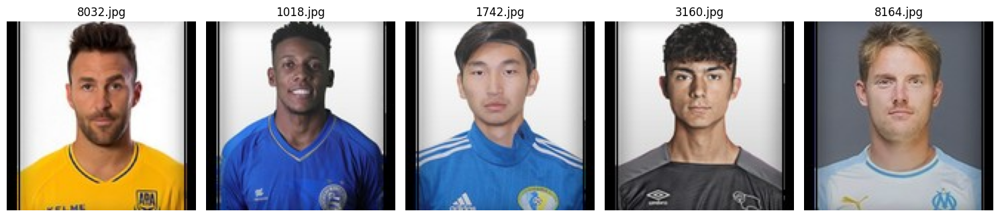

Displayed 5 sample images from '/root/.cache/kagglehub/datasets/birdy654/football-players-and-staff-faces/versions/1/football'.


In [5]:
import random

# Select a few random image files from the football_contents list
selected_images = random.sample(football_contents, 5) if len(football_contents) >= 5 else football_contents

plt.figure(figsize=(15, 5))
for i, image_name in enumerate(selected_images):
    image_path = os.path.join(football_path, image_name)
    img = Image.open(image_path)

    plt.subplot(1, len(selected_images), i + 1)
    plt.imshow(img)
    plt.title(image_name)
    plt.axis('off')

plt.tight_layout()
plt.show()

print(f"Displayed {len(selected_images)} sample images from '{football_path}'.")

In [6]:
import torchvision.transforms as transforms

image_size = 64

transform = transforms.Compose([
    transforms.Resize(image_size), # Resize images to image_size x image_size
    transforms.CenterCrop(image_size), # Crop the image from the center (for consistency)
    transforms.ToTensor(), # Convert images to PyTorch tensors
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)) # Normalize pixel values to [-1, 1]
])

print(f"Image transformations defined successfully with target size: {image_size}x{image_size}.")

Image transformations defined successfully with target size: 64x64.


In [7]:
import torch
import torchvision.datasets as datasets
from torch.utils.data import DataLoader

In [8]:
from torch.utils.data import Dataset

class FootballDataset(Dataset):
    def __init__(self, image_dir, transform=None):
        self.image_dir = image_dir
        self.transform = transform
        self.image_files = [os.path.join(image_dir, f) for f in os.listdir(image_dir) if f.endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp'))]

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_path = self.image_files[idx]
        image = Image.open(img_path).convert('RGB') # Ensure images are RGB
        if self.transform:
            image = self.transform(image)
        return image

batch_size = 64

dataset = FootballDataset(
    image_dir=football_path,
    transform=transform
)

dataloader = DataLoader(
    dataset,
    batch_size=batch_size,
    shuffle=True,
    num_workers=2
)

print(f"Dataset created with {len(dataset)} images.")
print(f"DataLoader created with batch size {batch_size} and {len(dataloader)} batches.")

Dataset created with 8599 images.
DataLoader created with batch size 64 and 135 batches.


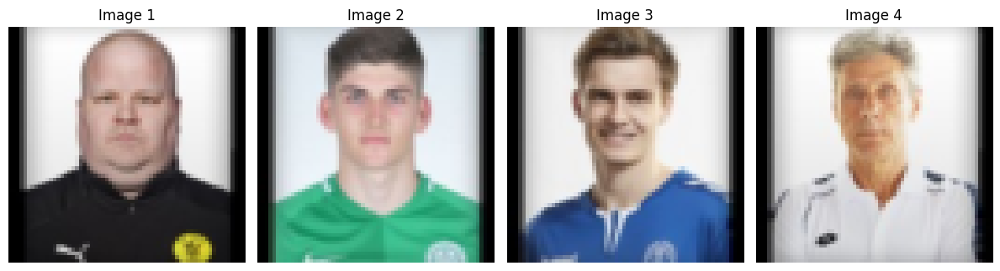

Shape of the retrieved batch: torch.Size([64, 3, 64, 64])
Min pixel value in batch: -1.0000
Max pixel value in batch: 1.0000


In [9]:
import numpy as np

images_batch = next(iter(dataloader))

num_images_to_display = 4
selected_images_tensor = images_batch[:num_images_to_display]

plt.figure(figsize=(12, 4))
for i, img_tensor in enumerate(selected_images_tensor):
    denormalized_img = (img_tensor * 0.5) + 0.5

    display_img = denormalized_img.permute(1, 2, 0)

    display_img_np = display_img.cpu().numpy()

    plt.subplot(1, num_images_to_display, i + 1)
    plt.imshow(display_img_np)
    plt.title(f"Image {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()

# 5. Print the shape and pixel value range of the retrieved batch
print(f"Shape of the retrieved batch: {images_batch.shape}")
print(f"Min pixel value in batch: {images_batch.min():.4f}")
print(f"Max pixel value in batch: {images_batch.max():.4f}")

In [10]:
import torch
import torch.nn as nn

device = "cuda" if torch.cuda.is_available() else "cpu"

z_dim = 100
batch_size = 64
lr = 2e-4
epochs = 80

In [11]:
class Generator(nn.Module):
    def __init__(self, z_dim=100):
        super().__init__()
        self.net = nn.Sequential(
            # z → 4x4
            nn.ConvTranspose2d(z_dim, 512, 4, 1, 0, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(True),

            # 8x8
            nn.ConvTranspose2d(512, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),

            # 16x16
            nn.ConvTranspose2d(256, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),

            # 32x32
            nn.ConvTranspose2d(128, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),

            # 64x64
            nn.ConvTranspose2d(64, 3, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, z):
        return self.net(z)

In [12]:
class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(3, 64, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(64, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(128, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(256, 512, 4, 2, 1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(512, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.net(x).view(-1, 1)


In [13]:
G = Generator(z_dim).to(device)
D = Discriminator().to(device)

criterion = nn.BCELoss()

opt_G = torch.optim.Adam(G.parameters(), lr=lr, betas=(0.5, 0.999))
opt_D = torch.optim.Adam(D.parameters(), lr=lr, betas=(0.5, 0.999))

Epoch [1/80] Loss D: 0.3483 Loss G: 6.2765


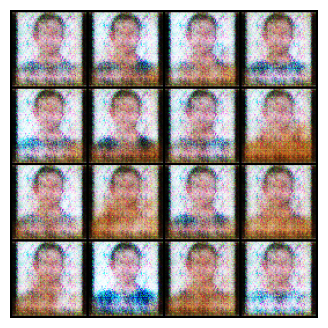

Epoch [2/80] Loss D: 0.2617 Loss G: 5.9754


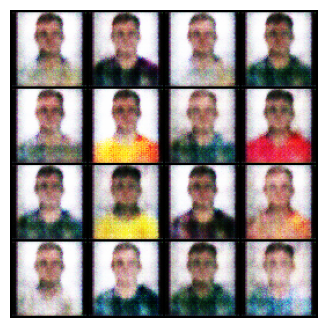

Epoch [3/80] Loss D: 0.3034 Loss G: 4.0107


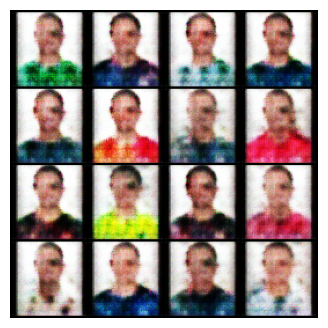

Epoch [4/80] Loss D: 0.2266 Loss G: 3.8925


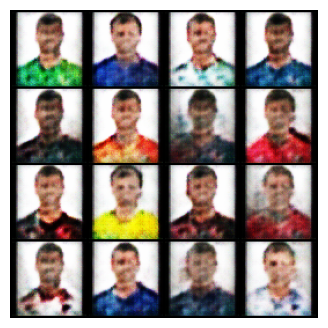

Epoch [5/80] Loss D: 0.2744 Loss G: 3.3618


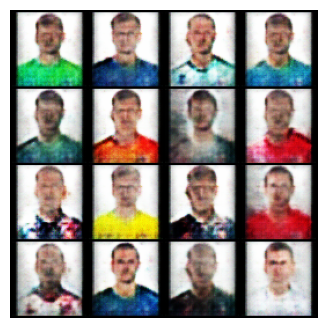

Epoch [6/80] Loss D: 0.2302 Loss G: 2.1953


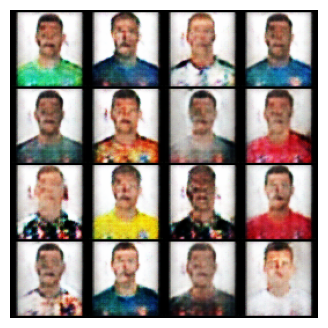

Epoch [7/80] Loss D: 0.4499 Loss G: 8.1964


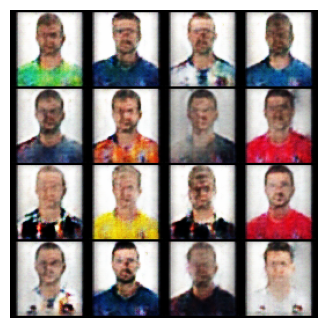

Epoch [8/80] Loss D: 0.2015 Loss G: 3.1067


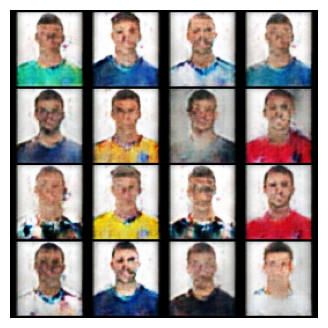

Epoch [9/80] Loss D: 0.6016 Loss G: 5.9702


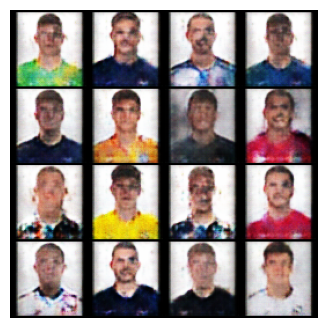

Epoch [10/80] Loss D: 0.2389 Loss G: 1.5585


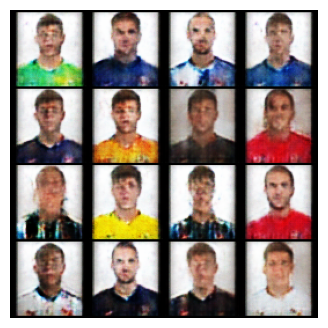

Epoch [11/80] Loss D: 0.1295 Loss G: 4.0735


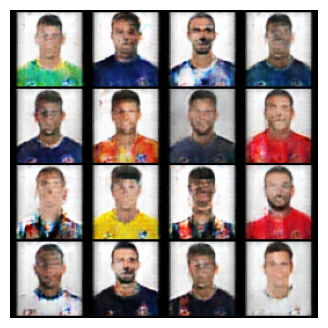

Epoch [12/80] Loss D: 0.1185 Loss G: 3.3902


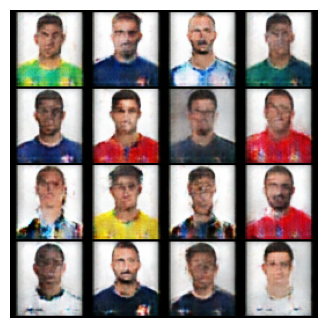

Epoch [13/80] Loss D: 0.8623 Loss G: 0.8600


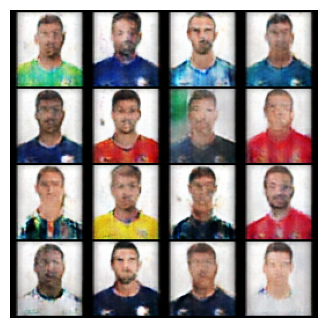

Epoch [14/80] Loss D: 0.1244 Loss G: 3.3589


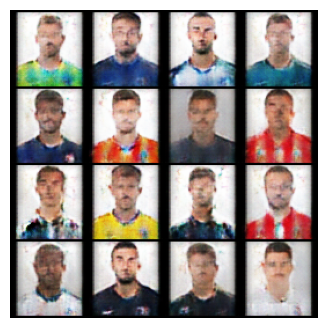

Epoch [15/80] Loss D: 0.2133 Loss G: 4.0937


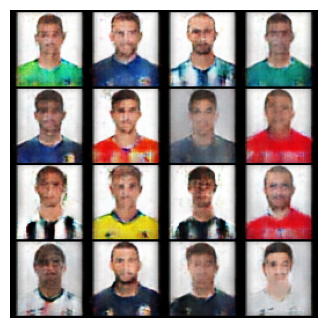

Epoch [16/80] Loss D: 0.1297 Loss G: 4.5360


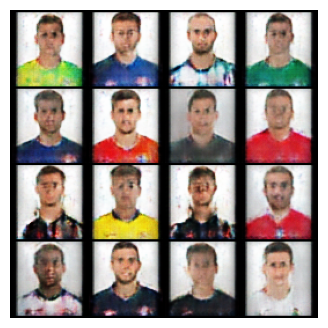

Epoch [17/80] Loss D: 0.0865 Loss G: 3.7164


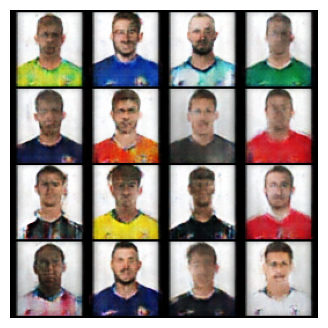

Epoch [18/80] Loss D: 0.3346 Loss G: 1.8665


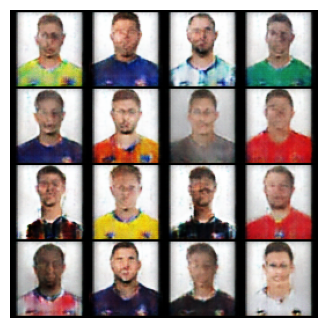

Epoch [19/80] Loss D: 0.1297 Loss G: 6.0619


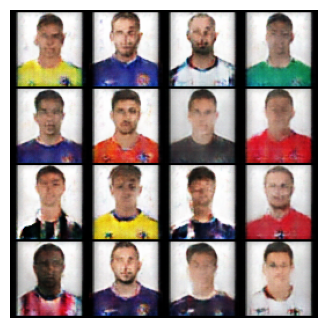

Epoch [20/80] Loss D: 0.3054 Loss G: 0.7504


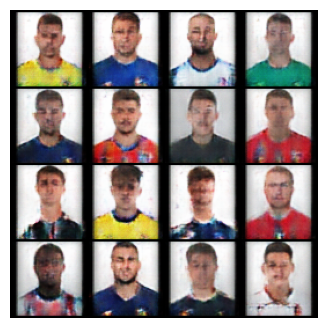

Epoch [21/80] Loss D: 0.0838 Loss G: 5.3310


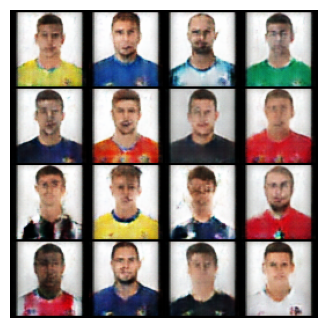

Epoch [22/80] Loss D: 0.0845 Loss G: 4.6454


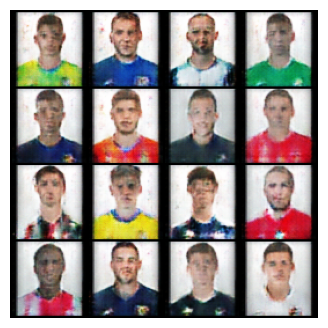

Epoch [23/80] Loss D: 0.1602 Loss G: 2.6327


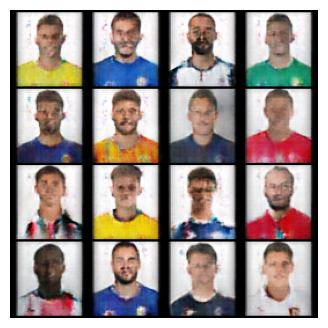

Epoch [24/80] Loss D: 0.1011 Loss G: 3.1038


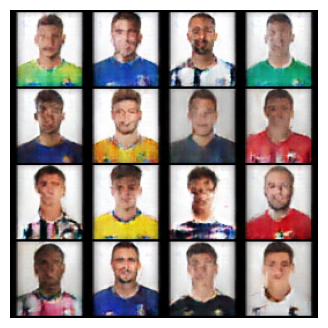

Epoch [25/80] Loss D: 0.1892 Loss G: 6.1929


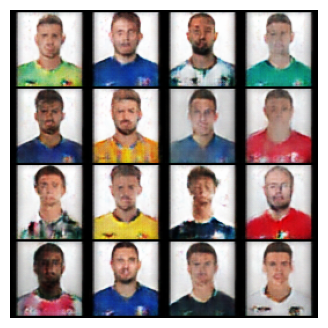

Epoch [26/80] Loss D: 0.0561 Loss G: 4.0346


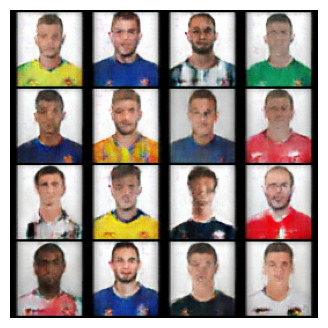

Epoch [27/80] Loss D: 0.0746 Loss G: 3.0223


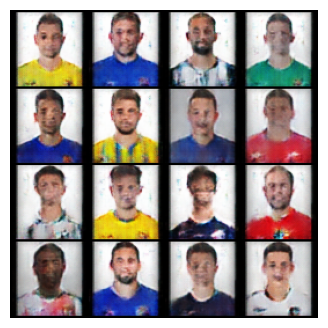

Epoch [28/80] Loss D: 0.1537 Loss G: 2.9110


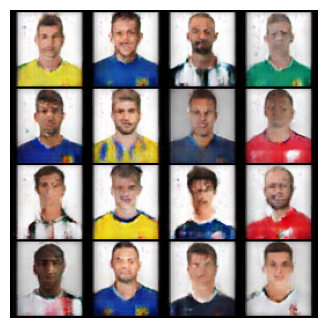

Epoch [29/80] Loss D: 0.0560 Loss G: 5.0533


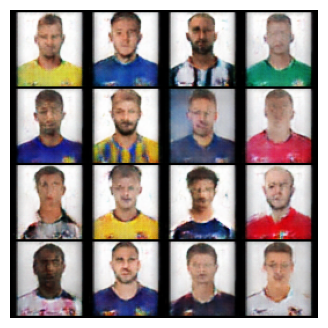

Epoch [30/80] Loss D: 0.3180 Loss G: 0.9678


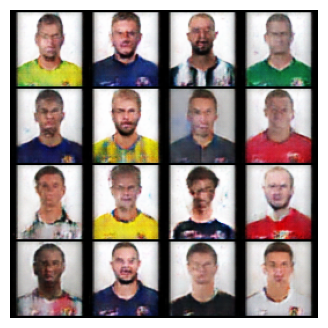

Epoch [31/80] Loss D: 0.1325 Loss G: 2.6505


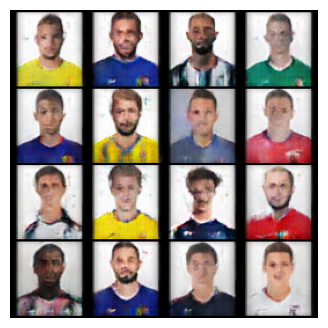

Epoch [32/80] Loss D: 0.1190 Loss G: 7.2779


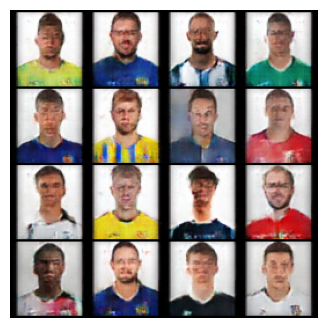

Epoch [33/80] Loss D: 0.0888 Loss G: 3.8996


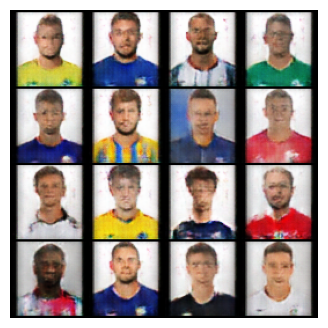

Epoch [34/80] Loss D: 0.2867 Loss G: 1.2037


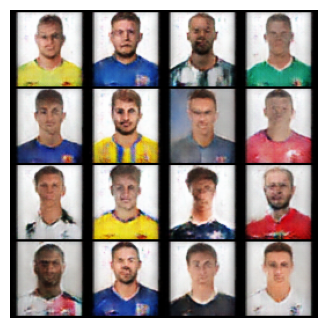

Epoch [35/80] Loss D: 0.1876 Loss G: 7.4154


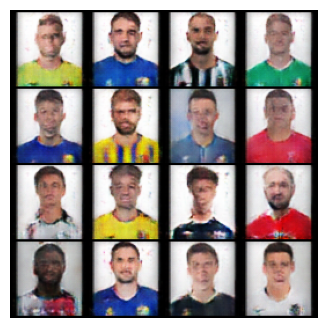

Epoch [36/80] Loss D: 0.0803 Loss G: 3.7299


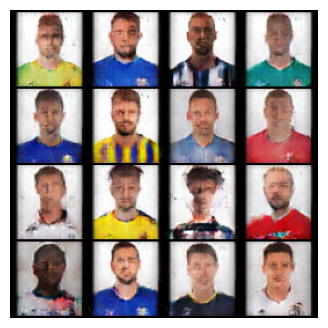

Epoch [37/80] Loss D: 0.1559 Loss G: 5.1497


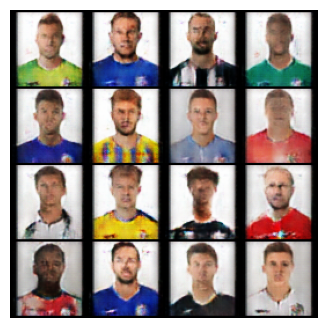

Epoch [38/80] Loss D: 0.4046 Loss G: 0.2756


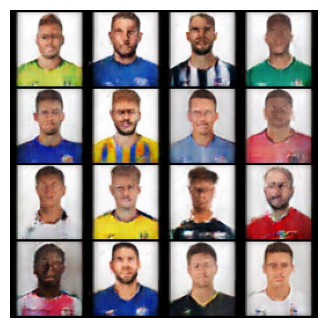

Epoch [39/80] Loss D: 0.4469 Loss G: 1.1993


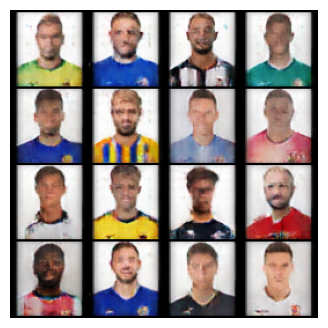

Epoch [40/80] Loss D: 0.0293 Loss G: 4.9431


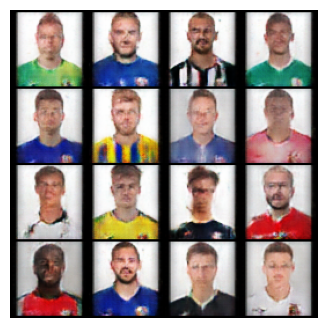

Epoch [41/80] Loss D: 0.2179 Loss G: 1.7801


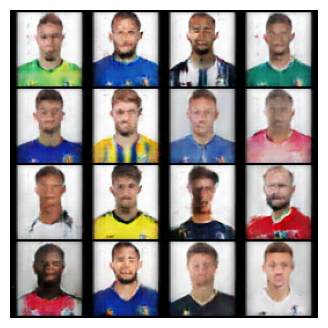

Epoch [42/80] Loss D: 0.0487 Loss G: 4.0175


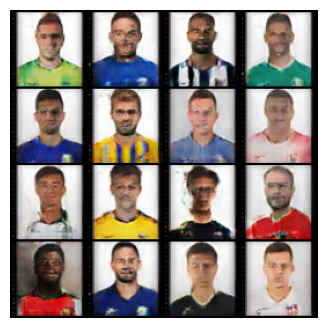

Epoch [43/80] Loss D: 0.3347 Loss G: 7.2348


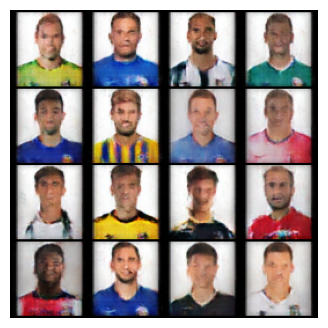

Epoch [44/80] Loss D: 0.2151 Loss G: 8.7756


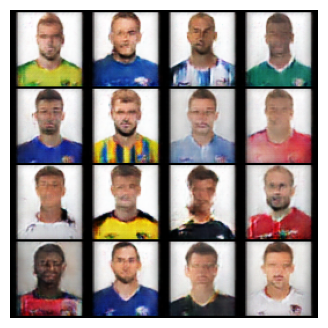

Epoch [45/80] Loss D: 0.0292 Loss G: 5.8068


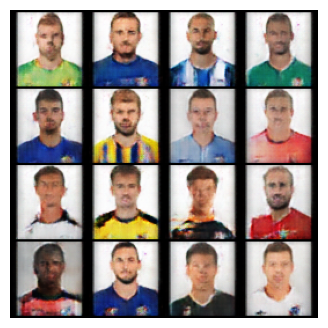

Epoch [46/80] Loss D: 0.0833 Loss G: 3.7564


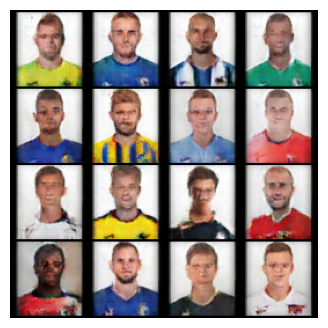

Epoch [47/80] Loss D: 0.2157 Loss G: 1.0359


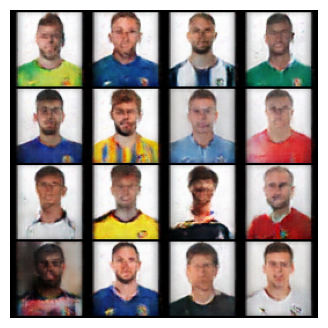

Epoch [48/80] Loss D: 0.0240 Loss G: 6.0545


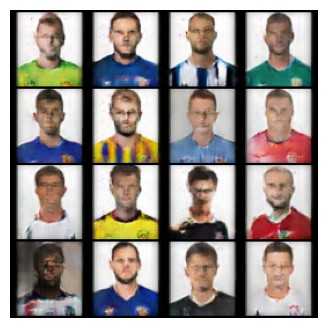

Epoch [49/80] Loss D: 0.1980 Loss G: 6.8218


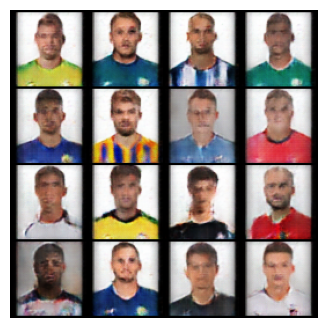

Epoch [50/80] Loss D: 0.0225 Loss G: 8.0167


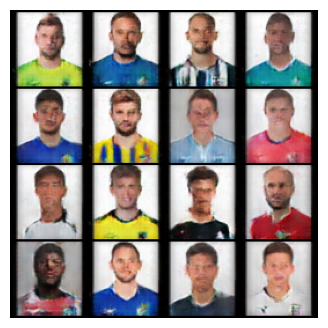

Epoch [51/80] Loss D: 0.1083 Loss G: 4.6682


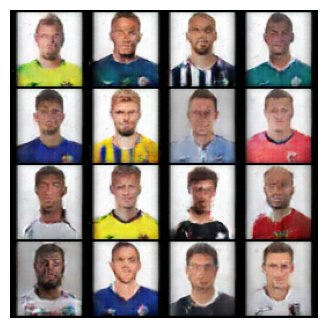

Epoch [52/80] Loss D: 0.0251 Loss G: 6.8253


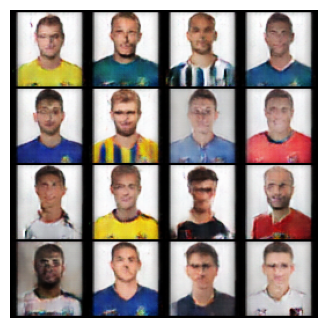

Epoch [53/80] Loss D: 0.0210 Loss G: 5.3247


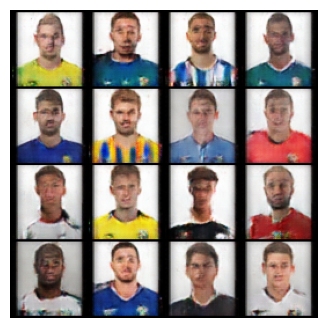

Epoch [54/80] Loss D: 0.0480 Loss G: 8.7047


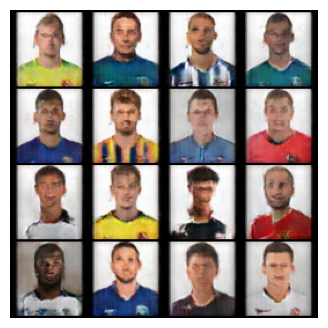

Epoch [55/80] Loss D: 0.0386 Loss G: 5.2786


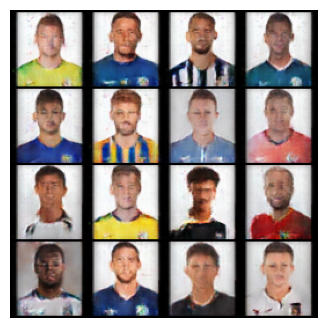

Epoch [56/80] Loss D: 0.0924 Loss G: 4.0196


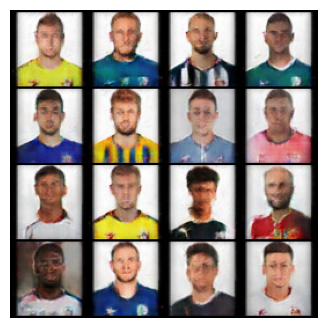

Epoch [57/80] Loss D: 0.0873 Loss G: 2.1453


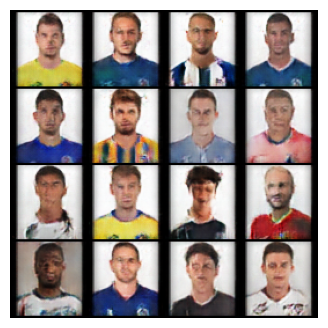

Epoch [58/80] Loss D: 0.0440 Loss G: 5.8983


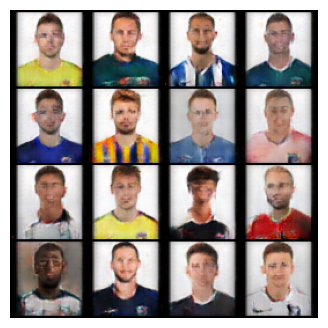

Epoch [59/80] Loss D: 0.0149 Loss G: 5.8453


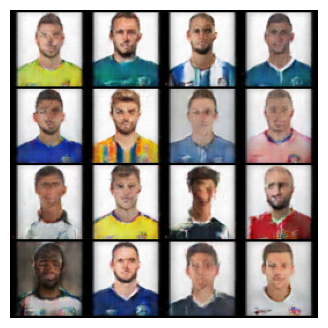

Epoch [60/80] Loss D: 0.0329 Loss G: 4.6864


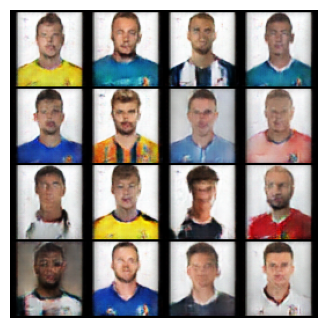

Epoch [61/80] Loss D: 0.1821 Loss G: 5.8385


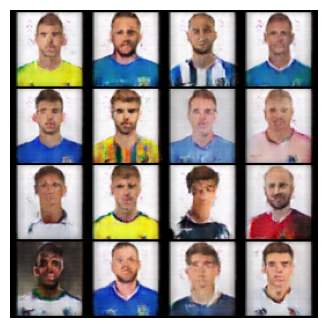

Epoch [62/80] Loss D: 0.0270 Loss G: 5.0562


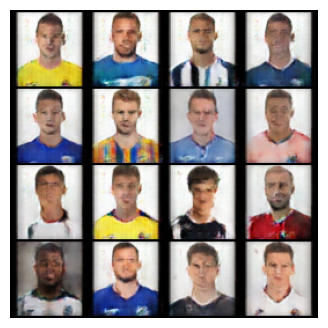

Epoch [63/80] Loss D: 0.0584 Loss G: 6.0551


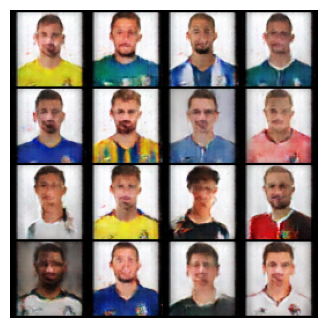

Epoch [64/80] Loss D: 0.0120 Loss G: 5.7697


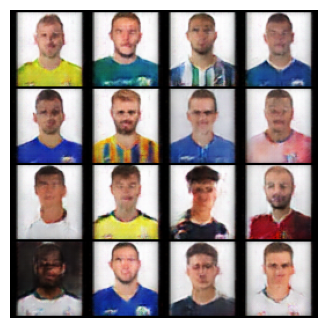

Epoch [65/80] Loss D: 0.0195 Loss G: 6.3345


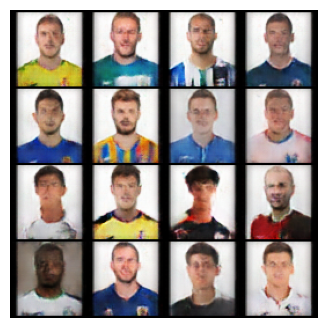

Epoch [66/80] Loss D: 0.0287 Loss G: 7.1993


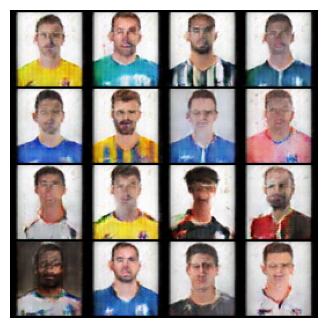

Epoch [67/80] Loss D: 0.1527 Loss G: 3.9903


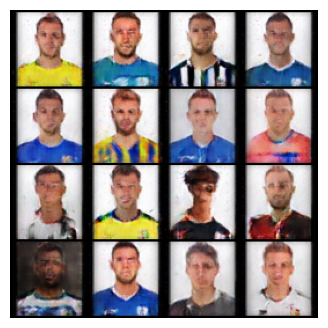

Epoch [68/80] Loss D: 0.0301 Loss G: 4.9437


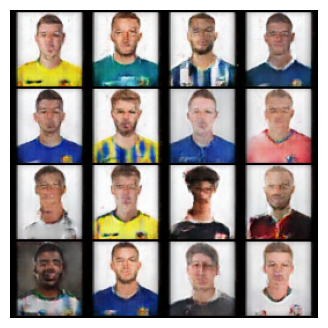

Epoch [69/80] Loss D: 0.0981 Loss G: 4.1784


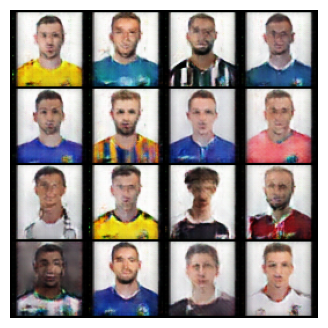

Epoch [70/80] Loss D: 0.0195 Loss G: 5.7410


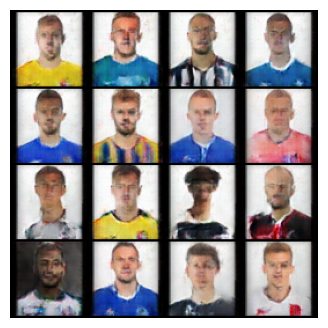

Epoch [71/80] Loss D: 0.0103 Loss G: 6.5889


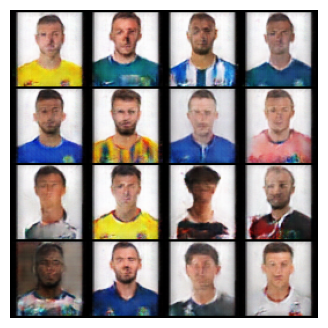

Epoch [72/80] Loss D: 0.0651 Loss G: 4.1925


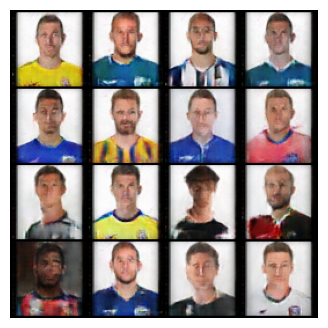

Epoch [73/80] Loss D: 0.0722 Loss G: 7.9859


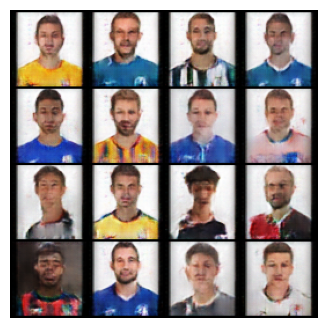

Epoch [74/80] Loss D: 0.0111 Loss G: 6.5597


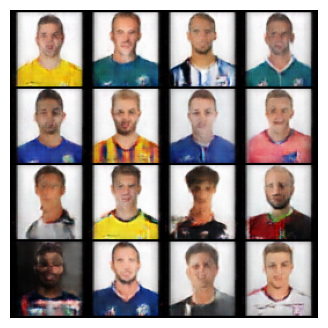

Epoch [75/80] Loss D: 0.0202 Loss G: 5.2071


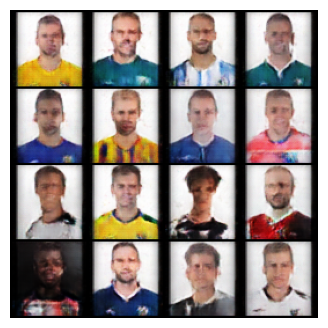

Epoch [76/80] Loss D: 0.1185 Loss G: 3.2390


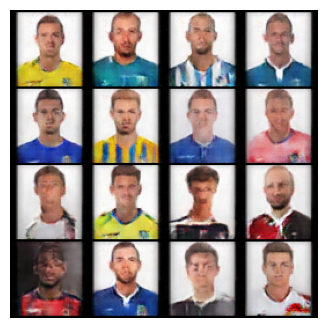

Epoch [77/80] Loss D: 0.1545 Loss G: 1.4836


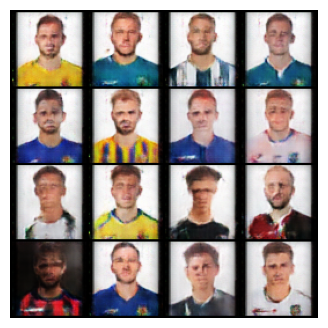

Epoch [78/80] Loss D: 0.0192 Loss G: 6.5906


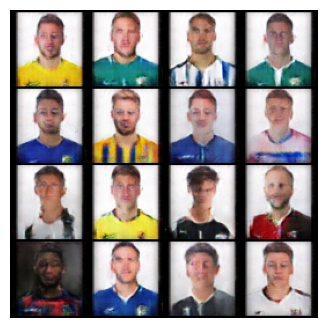

Epoch [79/80] Loss D: 0.0118 Loss G: 7.4879


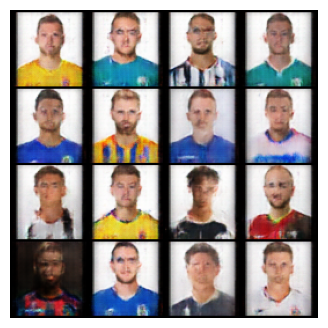

Epoch [80/80] Loss D: 0.0374 Loss G: 6.4243


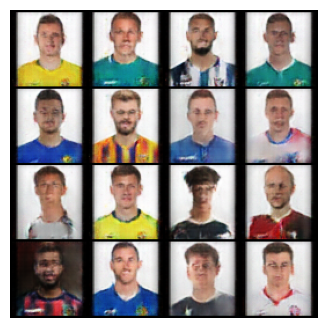

In [14]:
import torchvision.utils as vutils
import matplotlib.pyplot as plt

fixed_noise = torch.randn(16, z_dim, 1, 1, device=device)

for epoch in range(epochs):
    for real in dataloader:
        real = real.to(device)
        bsz = real.size(0)

        real_label = torch.ones(bsz, 1, device=device)
        fake_label = torch.zeros(bsz, 1, device=device)

        # ======================
        # Train Discriminator
        # ======================
        z = torch.randn(bsz, z_dim, 1, 1, device=device)
        fake = G(z)

        loss_D = (
            criterion(D(real), real_label) +
            criterion(D(fake.detach()), fake_label)
        ) / 2

        opt_D.zero_grad()
        loss_D.backward()
        opt_D.step()

        # ======================
        # Train Generator
        # ======================
        loss_G = criterion(D(fake), real_label)

        opt_G.zero_grad()
        loss_G.backward()
        opt_G.step()

    print(
        f"Epoch [{epoch+1}/{epochs}] "
        f"Loss D: {loss_D.item():.4f} "
        f"Loss G: {loss_G.item():.4f}"
    )

    # 🔍 visualize ทุก epoch
    with torch.no_grad():
        fake_samples = G(fixed_noise).detach().cpu()
        grid = vutils.make_grid(fake_samples, nrow=4, normalize=True)

        plt.figure(figsize=(4,4))
        plt.imshow(grid.permute(1,2,0))
        plt.axis("off")
        plt.show()

In [16]:
import os

os.makedirs("Football_players", exist_ok=True)

with torch.no_grad():
    z = torch.randn(10, z_dim, 1, 1, device=device)
    fake = G(z)

for i in range(10):
    vutils.save_image(
        fake[i],
        f"Football_players/player_{i}.png",
        normalize=True
    )

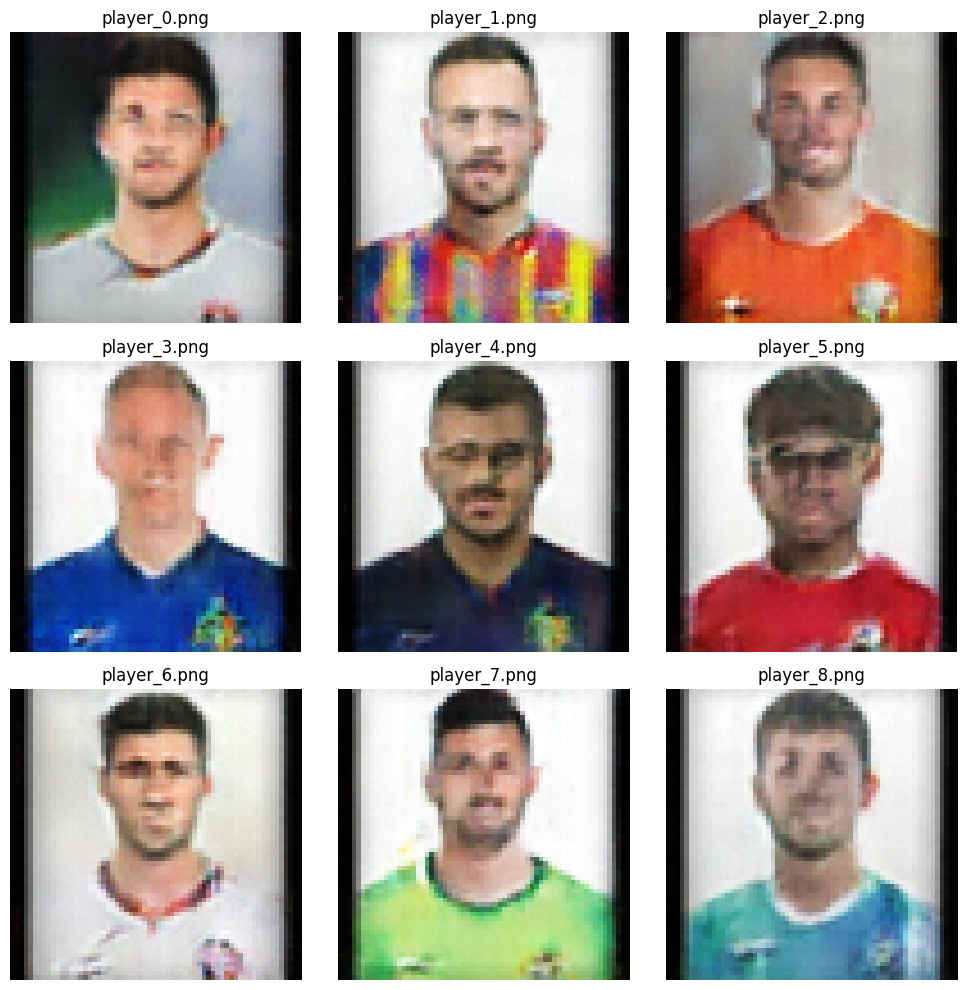

In [17]:
import matplotlib.pyplot as plt
from PIL import Image
import os

plt.figure(figsize=(10, 10))
for i in range(9):
    image_path = os.path.join("Football_players", f"player_{i}.png")
    img = Image.open(image_path)

    plt.subplot(3, 3, i + 1)
    plt.imshow(img)
    plt.title(f"player_{i}.png")
    plt.axis('off')

plt.tight_layout()
plt.show()